## Demo 6: Using CAST to align STARmap and SlideSeq Data

In [1]:
import CAST
import scanpy as sc
import torch, os
from os.path import join as pj
import warnings
warnings.filterwarnings("ignore")

work_dir = '$demo_path' #### input the demo path

### Application of CAST to samples collected using different spatial technologies 

Here we demonstrate CAST Mark and CAST Stack aligning samples collected by different technologies. Here, CAST aligns a STARmap sample to a SlideSeq sample. Notably, CAST is able to automatically search and match tissue anatomy in these samples without major changes from the user. This workflow is very similar to that in demos 4, 5 and 7 where CAST Mark and Stack are applied to a variety of samples. 

The system takes the input data in `.h5ad` format and creates the following outputs: 

- **CAST Mark**
    - Delaunay graphs representign each sample to train the graph neural network (each hemisphere of replicates at 2, 5, 10, 15, 20, 30, and 60 DPI)
    - The trained graph neural network 
    - The *k*-means (k=10) clustering results of the graph embedding generated by the graph neural network for each sample 

- **CAST Stack**
    - CAST's alignment of the right (damaged) hemisphere to the left (intact) hemisphere as reference for every sample. Three  These outputs include:
        - The initial aligment before CAST Stack is run 
        - The alignment after the affine transformation but before the B-Spline Free Form Deformation (FFD) adjustments 
        - The final alignment output by CAST Stack 
    - alignment for between the left and right hemispheres 


For more detail about CAST Mark and CAST Stack, see demos 1 and 2 respectively. 

#### Load/Prepare Data

In [2]:
## Reading input data and setting up the output directory

# Reading in the Slideseq data
sdata_SlideSeq = sc.read_h5ad(pj(work_dir, "demo6_STARmap_to_SlideSeq/data/Slide-seq-Puck_Num_42.h5ad"))
sdata_SlideSeq.obs = sdata_SlideSeq.obs[['Raw_Slideseq_X','Raw_Slideseq_Y']].copy()
sdata_SlideSeq.obs.rename(columns={'Raw_Slideseq_X':'center_x','Raw_Slideseq_Y':'center_y'},inplace=True)
sdata_SlideSeq.var.index = sdata_SlideSeq.var.values[:,0]

# Reading in the STARmap data
sdata_STAR = sc.read_h5ad(pj(work_dir, "demo6_STARmap_to_SlideSeq/data/RIBO_STAR_rep3.h5ad"))
sdata_STAR = sdata_STAR[sdata_STAR.obs['batch'] == 'STAR_rep3',:].copy()
sdata_STAR.X = sdata_STAR.layers['raw']
sdata_STAR.obs.rename(columns={'column':'center_x','row':'center_y'},inplace=True)

# output directory for the STARmap_vs_SlideSeq demo
output_path = pj(work_dir, "demo6_STARmap_to_SlideSeq/demo_output/STARmap_vs_SlideSeq") # set output_path
os.makedirs(output_path,exist_ok=True)

In [3]:
## Combine STARmap and Slide-seq data into one object

from CAST.utils import detect_highly_variable_genes


# combine the two datasets
sample_list= ['STARmap','Slide-seq']
sdata = sdata_STAR.concatenate(sdata_SlideSeq)

# rename the dataset labels to STARmap and Slide-seq
batch_key = 'batch'
batch_rename = {'0' : sample_list[0],'1' : sample_list[1]}
sdata.obs.replace({batch_key:batch_rename},inplace=True)

# Filter for highly variable genes 
sdata.var['highly_variable'] = detect_highly_variable_genes(sdata,batch_key=batch_key,n_top_genes=3000,count_layer='.X')
sdata = sdata[:,sdata.var['highly_variable']]

# Output the combined dataset
sdata.write_h5ad(f'{output_path}/STARmap_vs_SlideSeq.h5ad')

In [4]:
## Extract and subset the coordinate and expression data for each sample
# this took 5- 10 minutes 

from CAST.utils import extract_coords_exp, sub_data_extract


coords_raw,exps = extract_coords_exp(sdata, batch_key = 'batch', cols = ['center_x', 'center_y'], count_layer = '.X', data_format = 'norm1e4',ifcombat = True)
coords_sub,exp_sub,sub_node_idxs = sub_data_extract(sample_list,coords_raw, exps, nodenum_t = 20000)
torch.save(coords_raw, f'{output_path}/coords_raw.pt')
torch.save(sub_node_idxs, f'{output_path}/sub_node_idxs.pt')
torch.save(exp_sub, f'{output_path}/exp_sub.pt')
torch.save(coords_sub, f'{output_path}/coords_sub.pt')

Preprocessing...


#### CAST Mark

Constructing delaunay graphs for 2 samples...
Training on cuda:0...


Loss: -440.932 step time=0.209s: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 400/400 [01:22<00:00,  4.87it/s]


Finished.
The embedding, log, model files were saved to /home/unix/panj/wanglab/jessica/CAST/demo/demo6_STARmap_to_SlideSeq/demo_output/STARmap_vs_SlideSeq
Perform KMeans clustering on 40000 cells...
Plotting the KMeans clustering results...


array([1, 1, 1, ..., 1, 1, 7], dtype=int32)

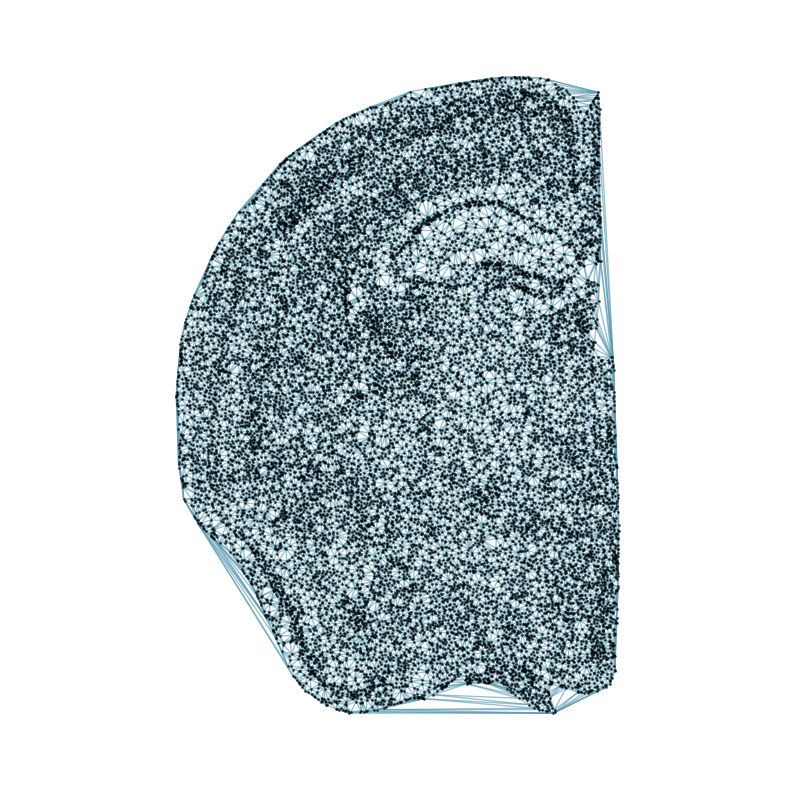

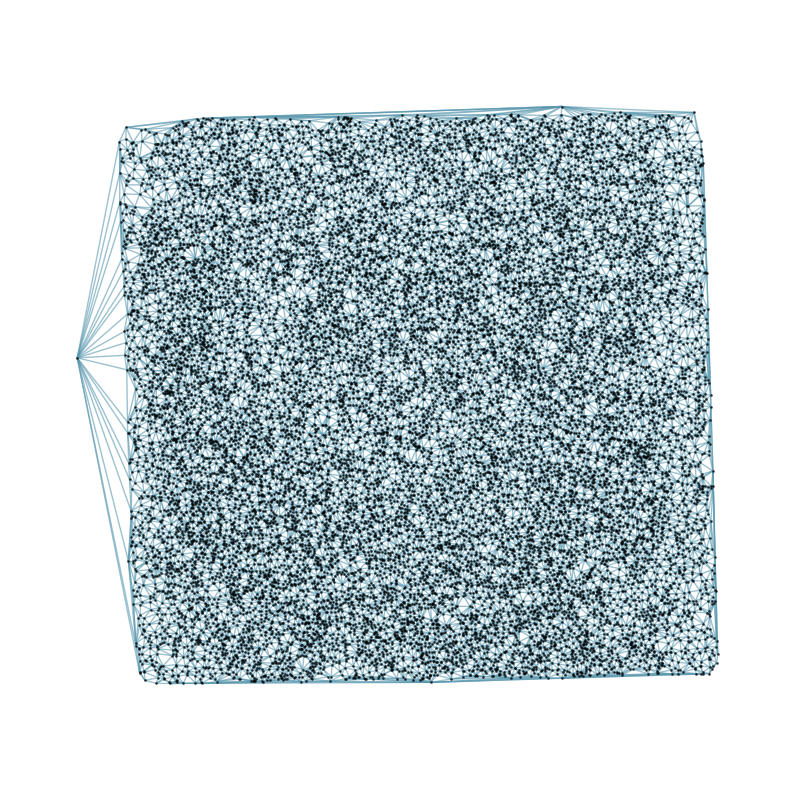

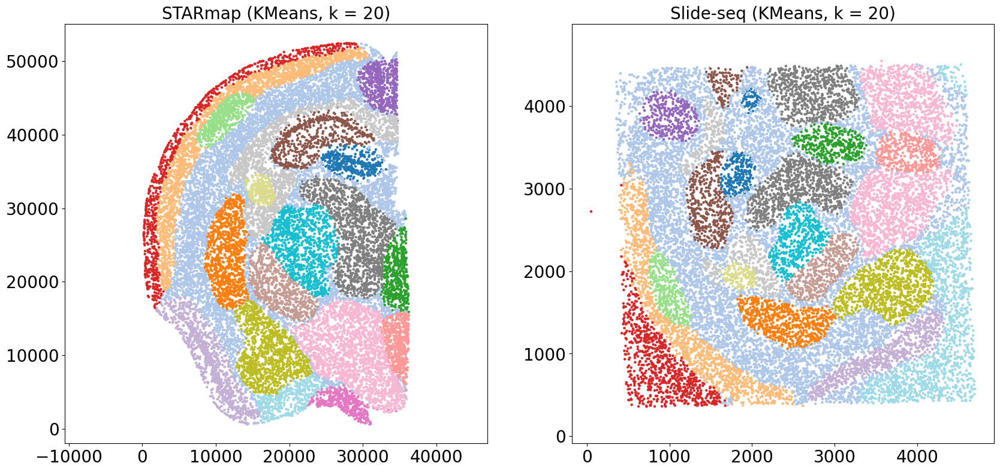

In [5]:
## Run CAST Mark — display the delaunay graphs and kmeans clustering for each sample

from CAST import CAST_MARK
from CAST.visualize import kmeans_plot_multiple


embed_dict = CAST_MARK(coords_sub,exp_sub,output_path,graph_strategy='delaunay')
kmeans_plot_multiple(embed_dict,sample_list,coords_sub,'demo1',output_path,k=20,dot_size = 10,minibatch=True)

#### CAST Stack

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 213.50it/s]


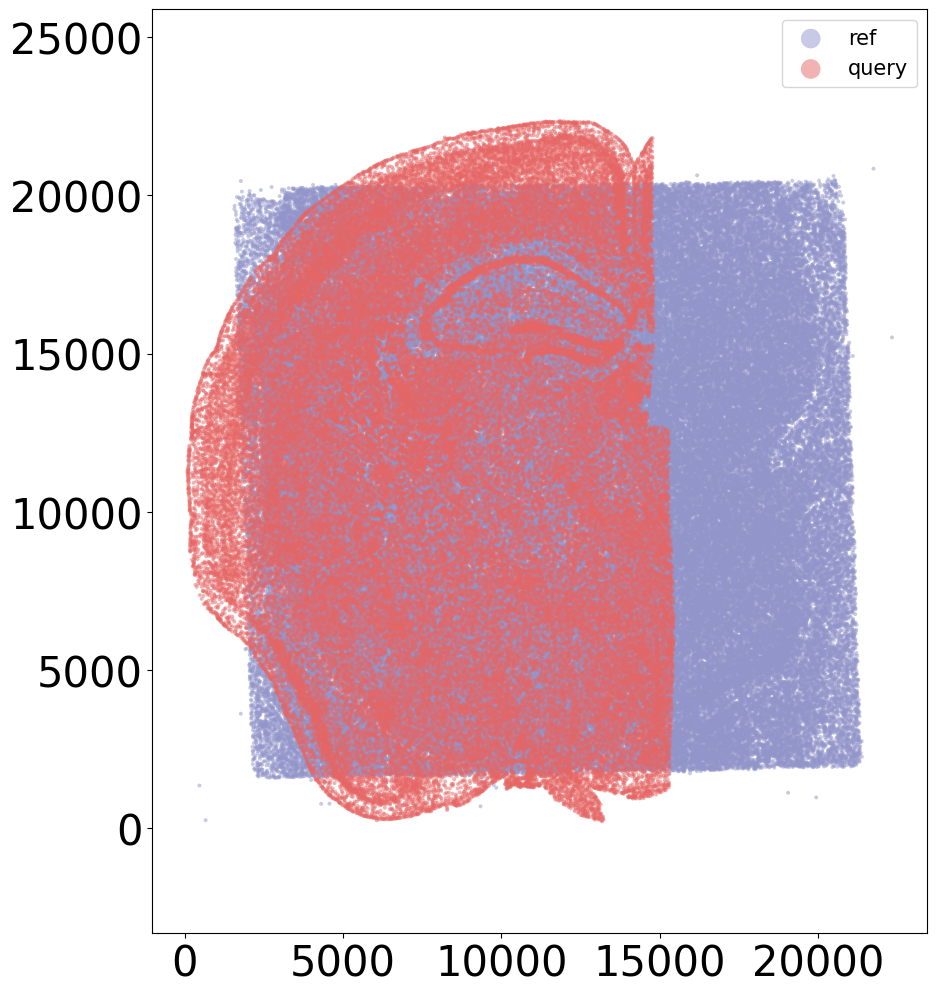

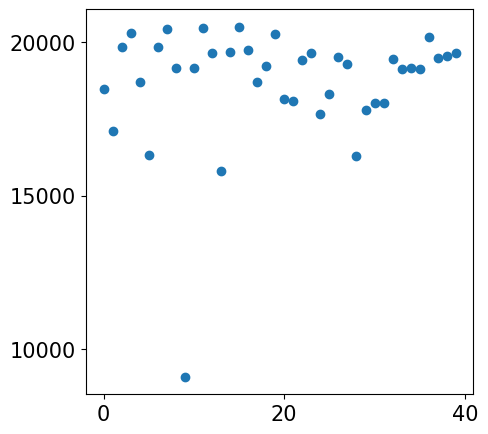

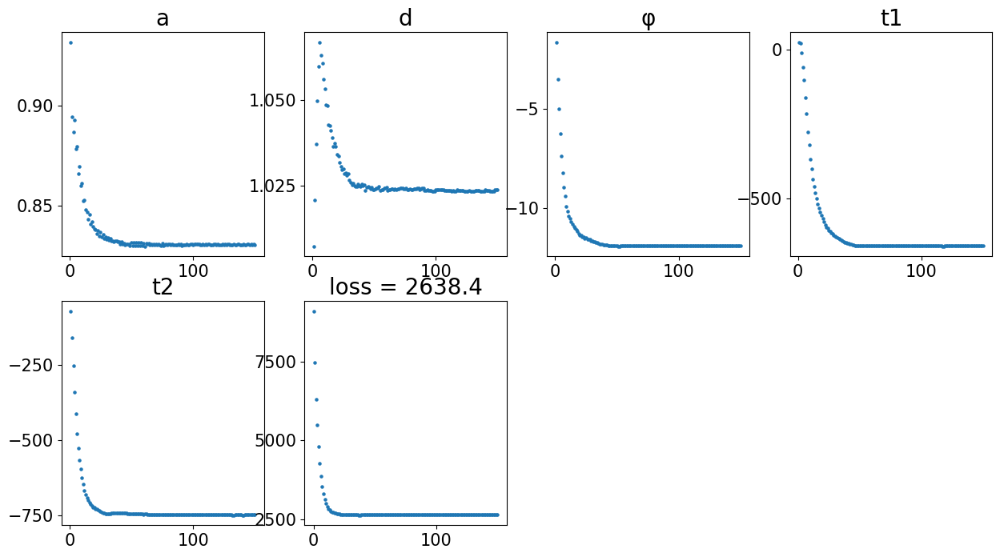

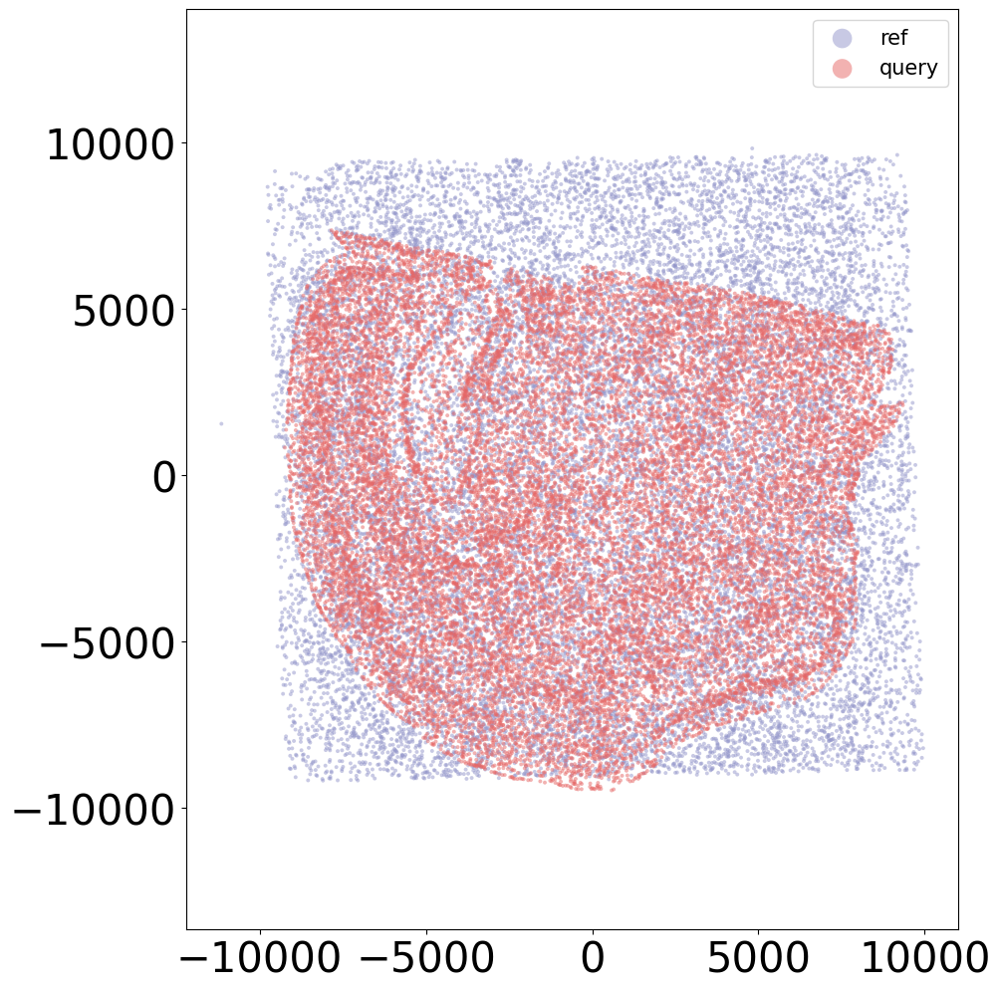

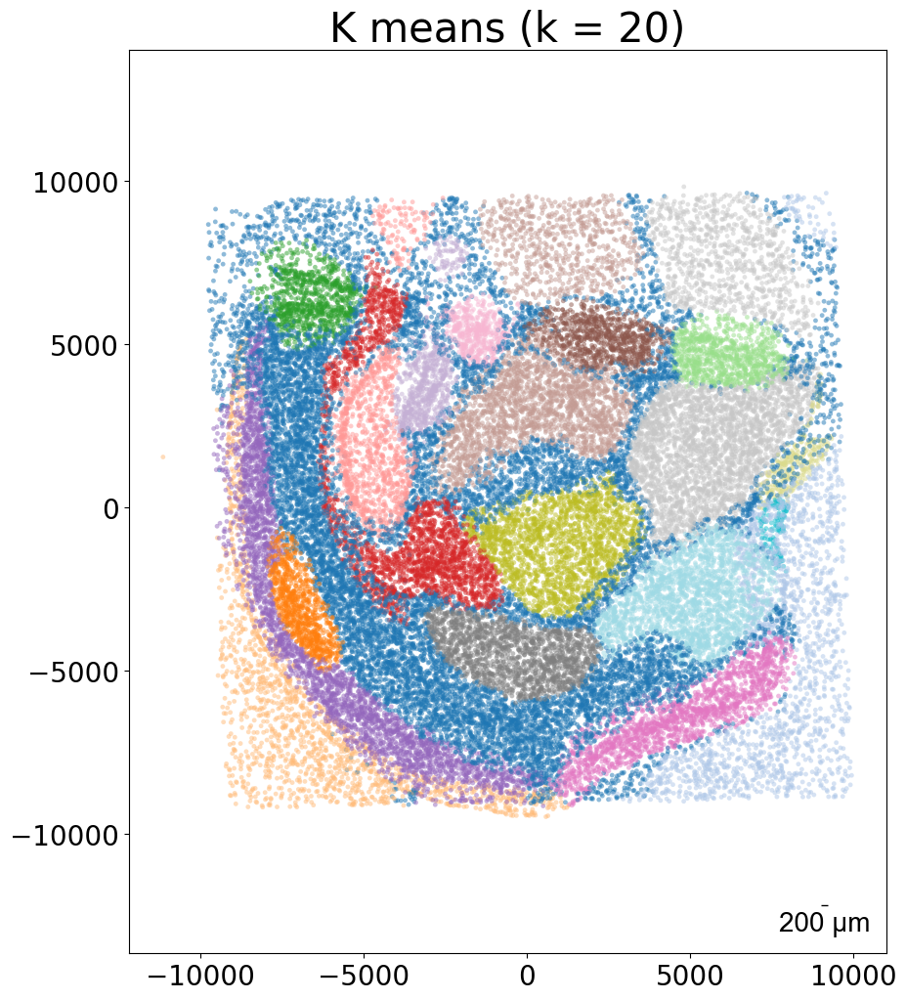

...

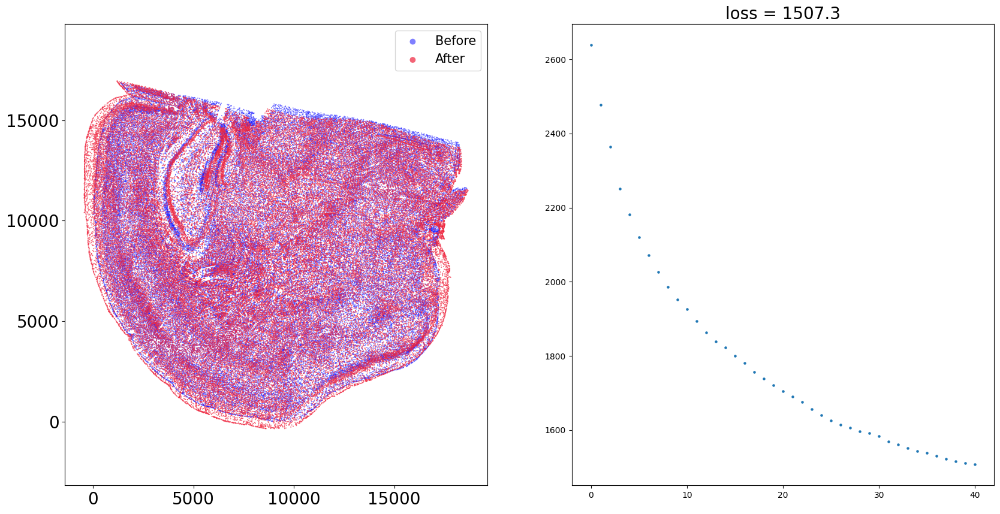

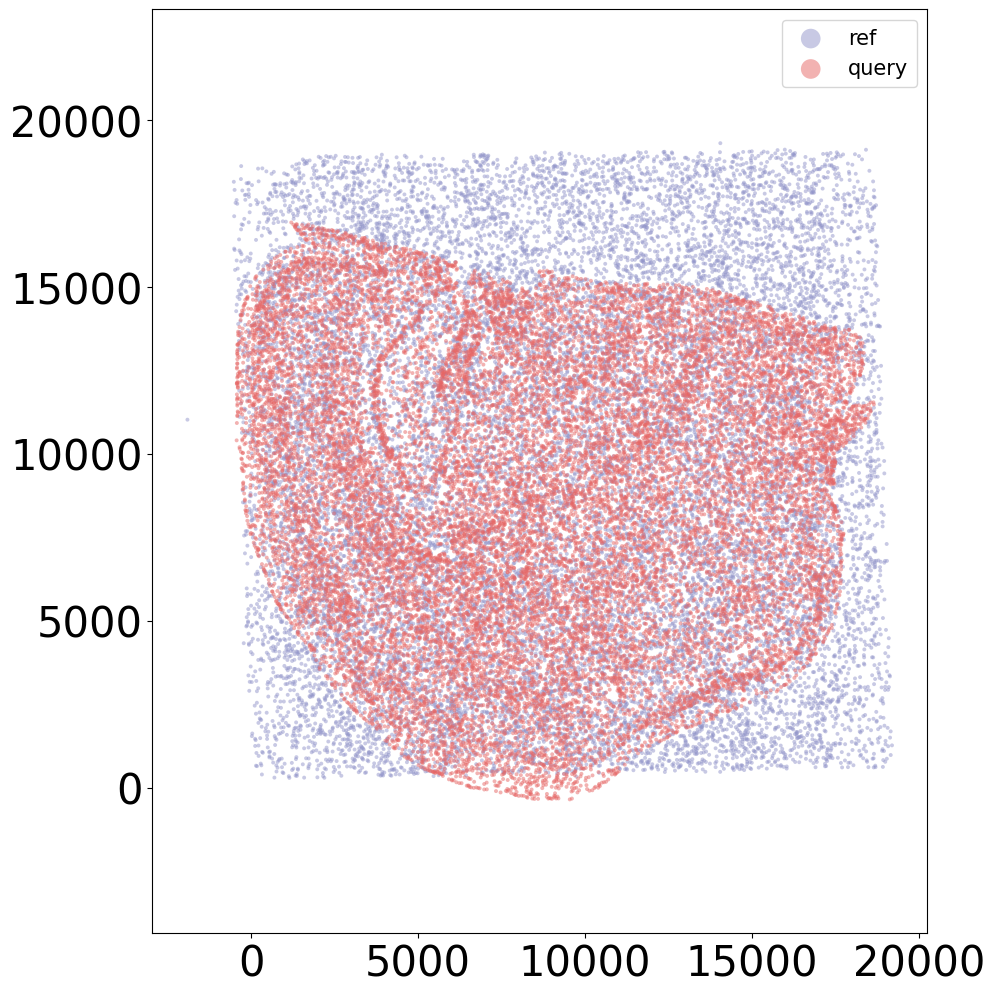

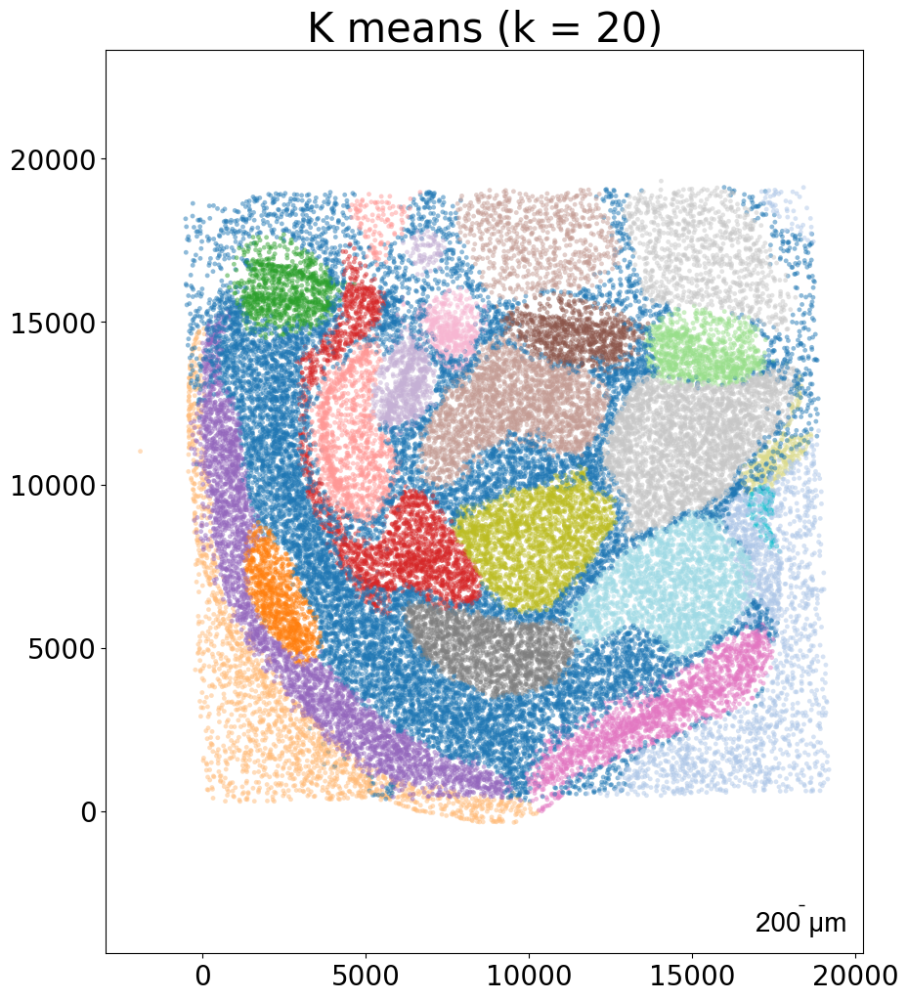

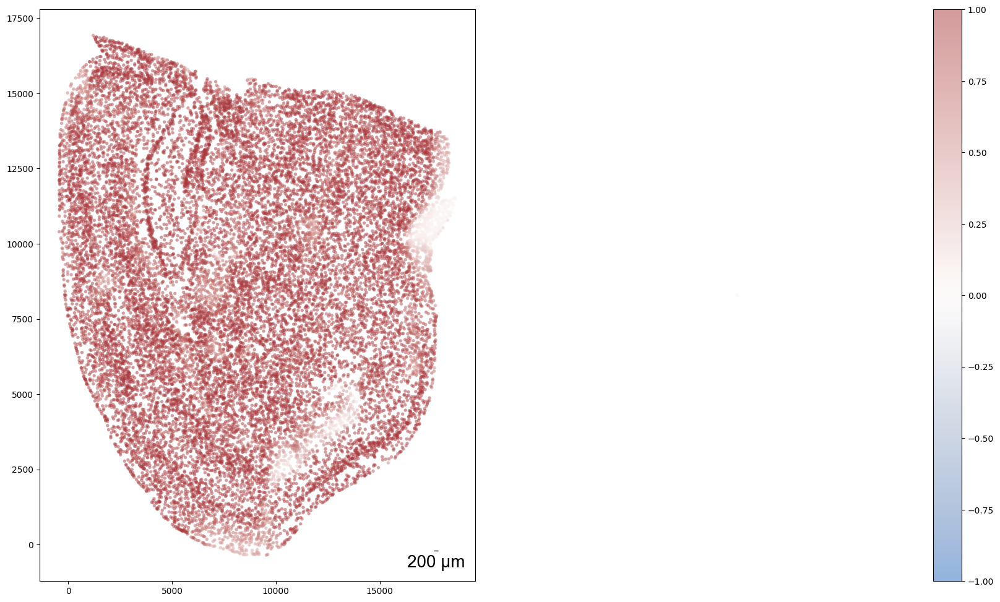

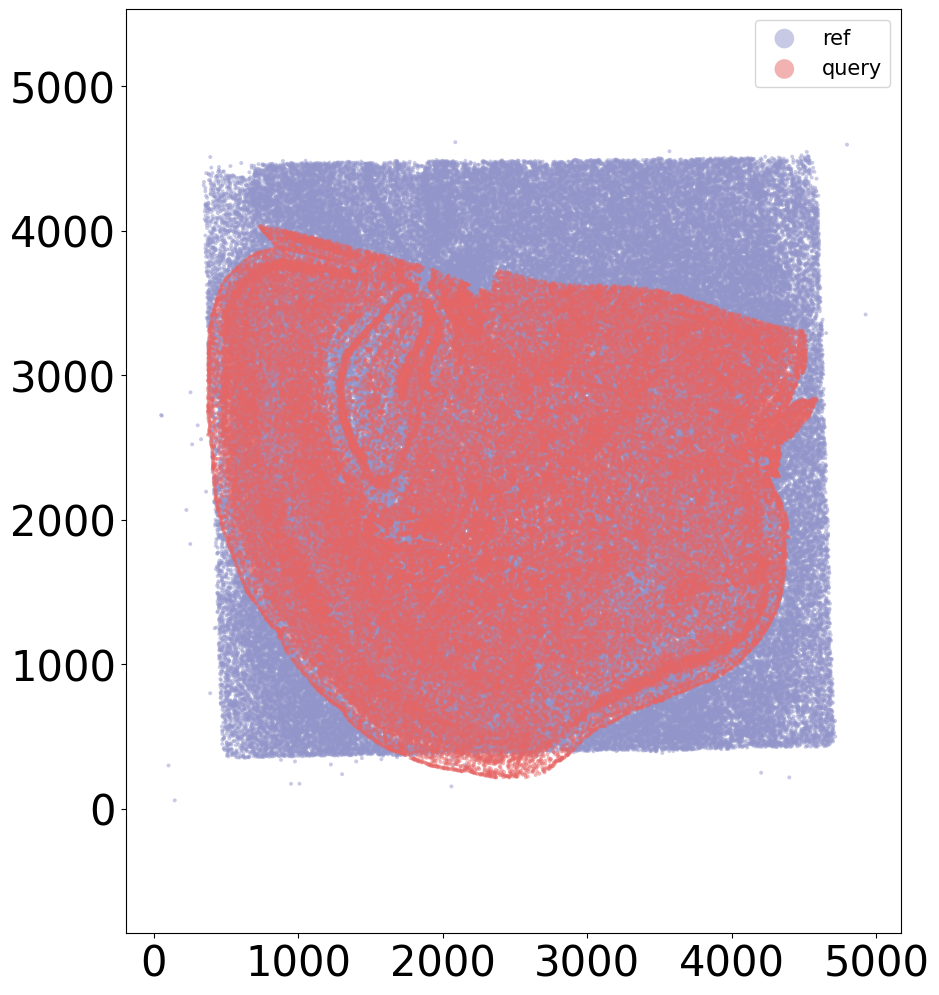

In [8]:
## Run CAST Stack — align the two samples

from CAST import CAST_STACK
from CAST.CAST_Stack import reg_params


# set the parameters for CAST Stack
query_sample = sample_list[0]
params_dist = reg_params(dataname = query_sample,
                            gpu = 0 if torch.cuda.is_available() else -1, 
                            #### Affine parameters
                            iterations=150,
                            dist_penalty1=0,
                            bleeding=500,
                            d_list = [3,2,1,1/2,1/3],
                            attention_params = [None,3,1,0], 
                            #### FFD parameters    
                            dist_penalty2 = [0],
                            alpha_basis_bs = [500],
                            meshsize = [8],
                            iterations_bs = [40],
                            attention_params_bs = [[None,3,1,0]],
                            mesh_weight = [None])
# set the alpha basis for the affine transformation
params_dist.alpha_basis = torch.Tensor([1/1000,1/1000,1/50,5,5]).reshape(5,1).to(params_dist.device)

# run CAST Stack
coord_final = CAST_STACK(coords_raw,embed_dict,output_path,sample_list,params_dist,sub_node_idxs = sub_node_idxs, rescale=True)

#### Visualize Final Alignment

Perform KMeans clustering on 40000 cells...
Plotting the KMeans clustering results...
Perform KMeans clustering on 40000 cells...
Plotting the KMeans clustering results...


array([1, 1, 1, ..., 1, 1, 7], dtype=int32)

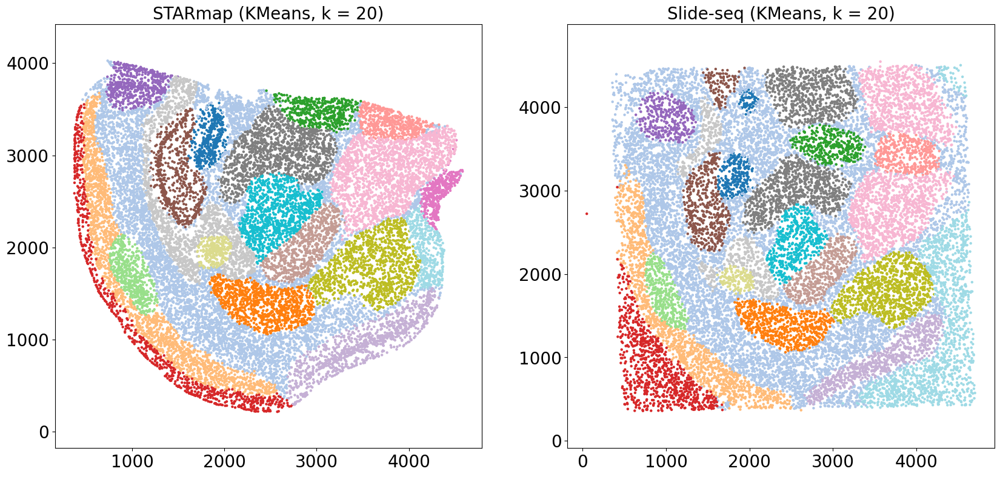

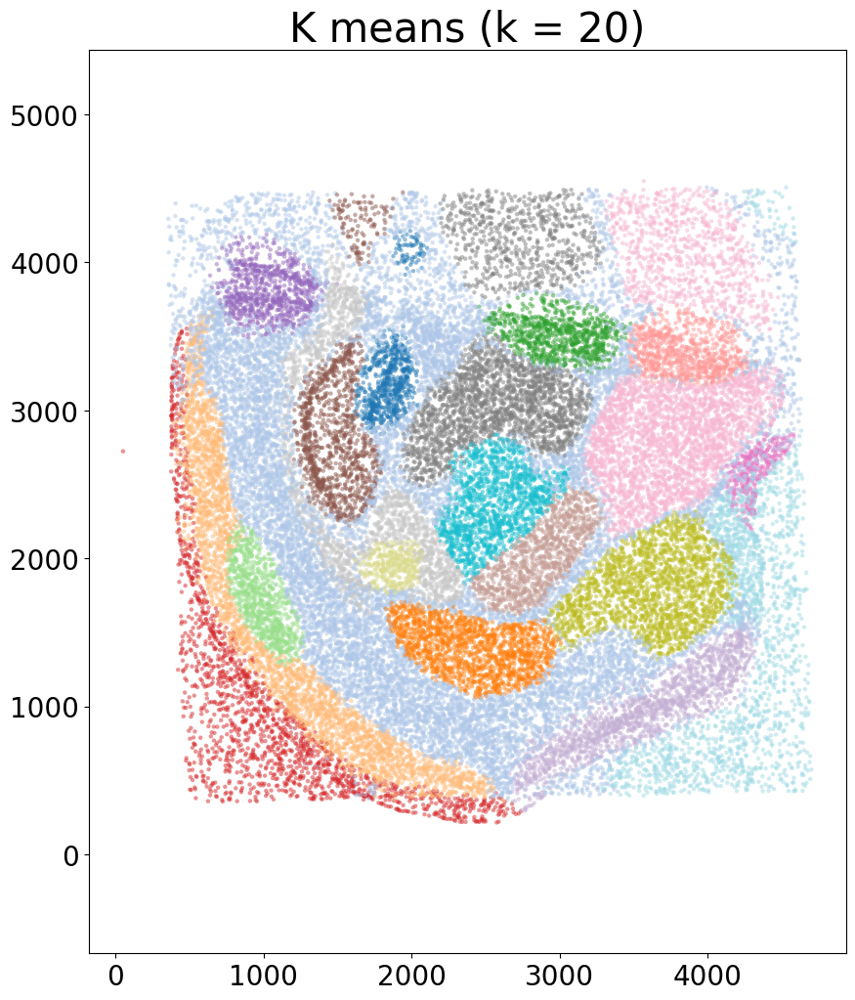

In [9]:
## Visualize the aligned data

from CAST.visualize import kmeans_plot_multiple


coords_sub_new = dict()
for sample_t in sample_list:
    coords_sub_new[sample_t] = coord_final[sample_t][sub_node_idxs[sample_t],:]

# Side-by-side plots 
kmeans_plot_multiple(embed_dict,sample_list,coords_sub_new,'demo1_new',output_path,k=20,dot_size = 10,minibatch=True)
# Overlay plot
kmeans_plot_multiple(embed_dict,sample_list,coords_sub_new,'demo1_new',output_path,k=20,dot_size = 10,minibatch=True,plot_strategy='stack')